# **Preparing Dependancies**

In [1]:
!pip install -q diffusers transformers accelerate safetensors pillow

# **Kriteria 1: Melakukan Image Generation dari Teks (Text-to-Image)**

## **Load Base Pipeline Model**

In [2]:
import torch
import gc
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image, ImageDraw, ImageFilter
import time
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation, pipeline as hf_pipeline

from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    EulerDiscreteScheduler,
    DPMSolverMultistepScheduler,
    DDIMScheduler,
    PNDMScheduler,
    StableDiffusionInpaintPipeline
)

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    dtype=torch.float16,
    use_safetensors=True,
    safety_checker=None
)

pipe = pipe.to("cuda")
pipe.enable_attention_slicing()

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Keyword arguments {'dtype': torch.float16} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


## **Generate Image**

In [3]:
def generate_simple_image(prompt, negative_prompt="", seed=42):
    generator = torch.Generator().manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator
    ).images[0]

    return image


def generate_advanced_image(prompt, negative_prompt="", seed=42,
                             guidance_scale=7.5, num_inference_steps=50):
    generator = torch.Generator().manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

    return image


seed = 222

negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)

prompt = (
    "an astronaut in a white spacesuit standing on the surface of mars, "
    "red sandy terrain, black starry sky, planet earth visible in the background upper right, "
    "cartoon style, illustration, digital art, 2D art style"
)


print("Generating simple image...")
simple_image = generate_simple_image(
    prompt=prompt,
    negative_prompt=negative_prompt,
    seed=seed
)
simple_image.save("output_simple.png")
print("Saved: output_simple.png")
simple_image.show()


print("Generating advanced image...")
advanced_image = generate_advanced_image(
    prompt=prompt,
    negative_prompt=negative_prompt,
    seed=seed,
    guidance_scale=9.0,
    num_inference_steps=75
)
advanced_image.save("output_advanced.png")
print("Saved: output_advanced.png")
advanced_image.show()

Generating simple image...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: output_simple.png
Generating advanced image...


  0%|          | 0/75 [00:00<?, ?it/s]

Saved: output_advanced.png


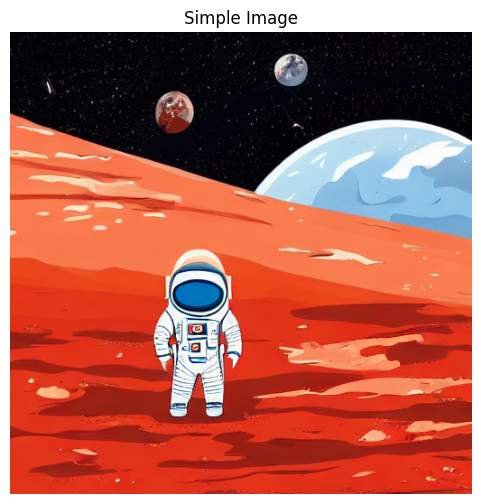

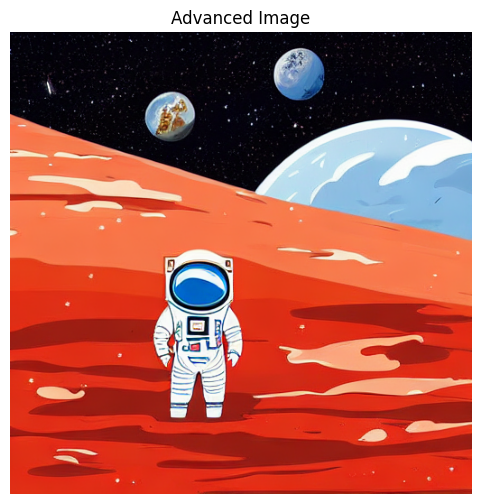

In [4]:
plt.figure(figsize=(6,6))
plt.imshow(simple_image)
plt.title("Simple Image")
plt.axis('off')
plt.show()

plt.figure(figsize=(6,6))
plt.imshow(advanced_image)
plt.title("Advanced Image")
plt.axis('off')
plt.show()

## **Generate Image with Hyperparameter Configuration**

In [5]:
seed = 222

negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)

prompt = (
    "an astronaut in a white spacesuit standing on the surface of mars, "
    "red sandy terrain, black starry sky, planet earth visible in the background upper right, "
    "cartoon style, illustration, digital art, 2D art style"
)

## **Guidance Scale Comparison**

Generating guidance_scale=2.0...


  0%|          | 0/50 [00:00<?, ?it/s]

Generating guidance_scale=15.0...


  0%|          | 0/50 [00:00<?, ?it/s]

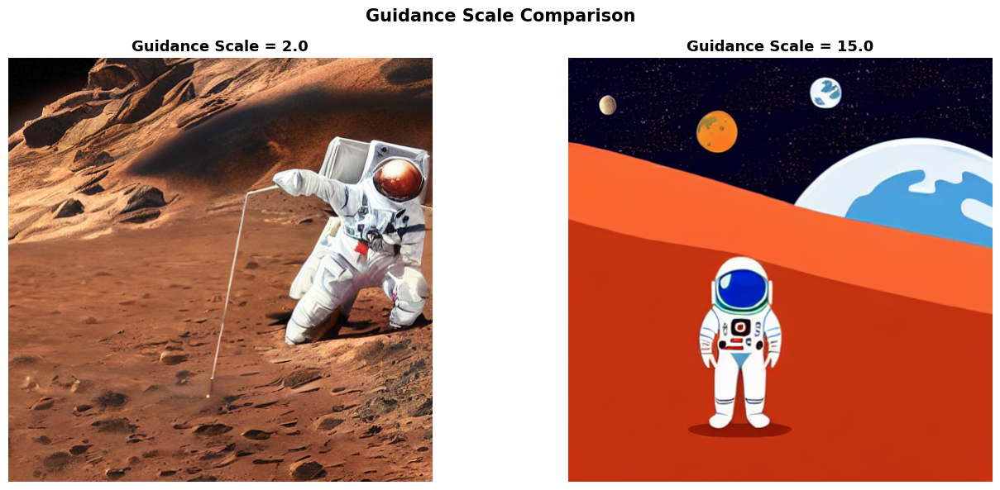

Saved: guidance_scale_comparison.png


In [6]:
def generate_advanced_image(prompt, negative_prompt="", seed=42,
                             guidance_scale=7.5, num_inference_steps=50):
    generator = torch.Generator().manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

    return image

guidance_scales = [2.0, 15.0]
gs_images = []

for gs in guidance_scales:
    print(f"Generating guidance_scale={gs}...")
    img = generate_advanced_image(
        prompt=prompt,
        negative_prompt=negative_prompt,
        seed=seed,
        guidance_scale=gs,
        num_inference_steps=50
    )
    gs_images.append((gs, img))
    img.save(f"gs_{gs}.png")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for i, (gs, img) in enumerate(gs_images):
    axes[i].imshow(img)
    axes[i].set_title(f"Guidance Scale = {gs}", fontsize=13, fontweight='bold')
    axes[i].axis('off')
plt.suptitle("Guidance Scale Comparison", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("guidance_scale_comparison.png", dpi=150)
plt.show()
print("Saved: guidance_scale_comparison.png")

### **Guidance Scale Explanation:**

*   **Gambar dengan "Scale" Rendah (2.0):**   
1.   Gambar terlihat lebih bebas dan kreatif, tidak terlalu terikat pada prompt.
2.   Warna fan komposisi cenderung lebih bervariasi dan tidak konsisten dengan deskripsi.


*   **Gambar dengan "Scale" Tinggi (15.0):**   

1.   Gambar lebih sesuai dan mengikuti detsil prompt secara ketat.
2.   Elemen seperti astronaut, tanah merah, dan bumi lebih jelas dan terstruktur.

## **Inference Steps Comparison**

Generating num_inference_steps=5...


  0%|          | 0/5 [00:00<?, ?it/s]

Generating num_inference_steps=50...


  0%|          | 0/50 [00:00<?, ?it/s]

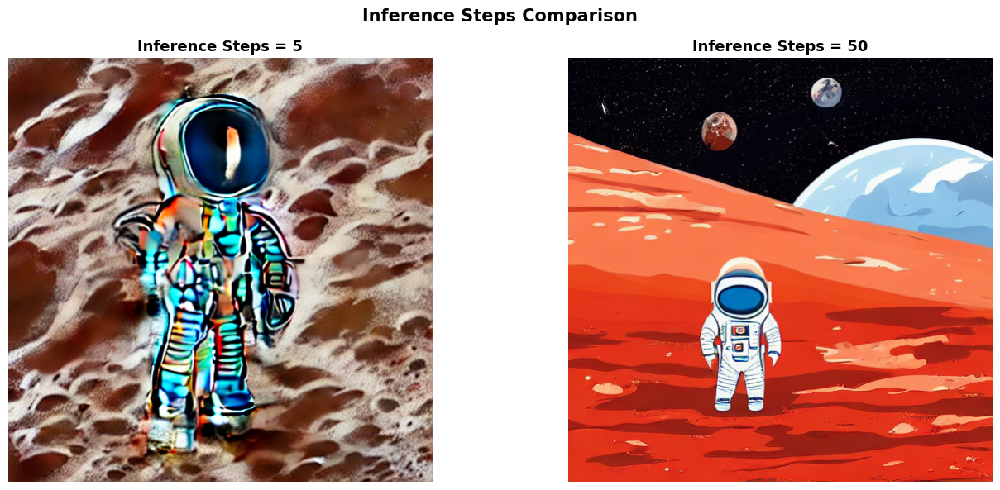

Saved: inference_steps_comparison.png


In [7]:
def generate_advanced_image(prompt, negative_prompt="", seed=42,
                             guidance_scale=7.5, num_inference_steps=50):
    generator = torch.Generator().manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

    return image

inference_steps_list = [5, 50]
steps_images = []

for steps in inference_steps_list:
    print(f"Generating num_inference_steps={steps}...")
    img = generate_advanced_image(
        prompt=prompt,
        negative_prompt=negative_prompt,
        seed=seed,
        guidance_scale=7.5,
        num_inference_steps=steps
    )
    steps_images.append((steps, img))
    img.save(f"steps_{steps}.png")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
for i, (steps, img) in enumerate(steps_images):
    axes[i].imshow(img)
    axes[i].set_title(f"Inference Steps = {steps}", fontsize=13, fontweight='bold')
    axes[i].axis('off')
plt.suptitle("Inference Steps Comparison", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("inference_steps_comparison.png", dpi=150)
plt.show()
print("Saved: inference_steps_comparison.png")

### **Inference Step Explanation:**

*   **Gambar dengan "Step" Rendah (5):**  

1.   Gambar terlihat kasar, buram, dan kurang detail

2.   Noise dan artefak visual masih banyak terlihat
3.   Komposisi belum terbentuk sempurna, elemen sulit dikenali


*   **Gambar dengan "Step" Tinggi (50):**

1.   Gambar jauh lebih tajam, bersih, dan detail
2.   Noise berkurang drastis, hasil lebih halus dan stabil
3.   Elemen visual seperti astronaut dan latar belakang terbentuk dengan jelas

## **Batch Inference from One Prompt**

Generating batch inference...


  0%|          | 0/50 [00:00<?, ?it/s]

Generated seed=42


  0%|          | 0/50 [00:00<?, ?it/s]

Generated seed=123


  0%|          | 0/50 [00:00<?, ?it/s]

Generated seed=222


  0%|          | 0/50 [00:00<?, ?it/s]

Generated seed=999


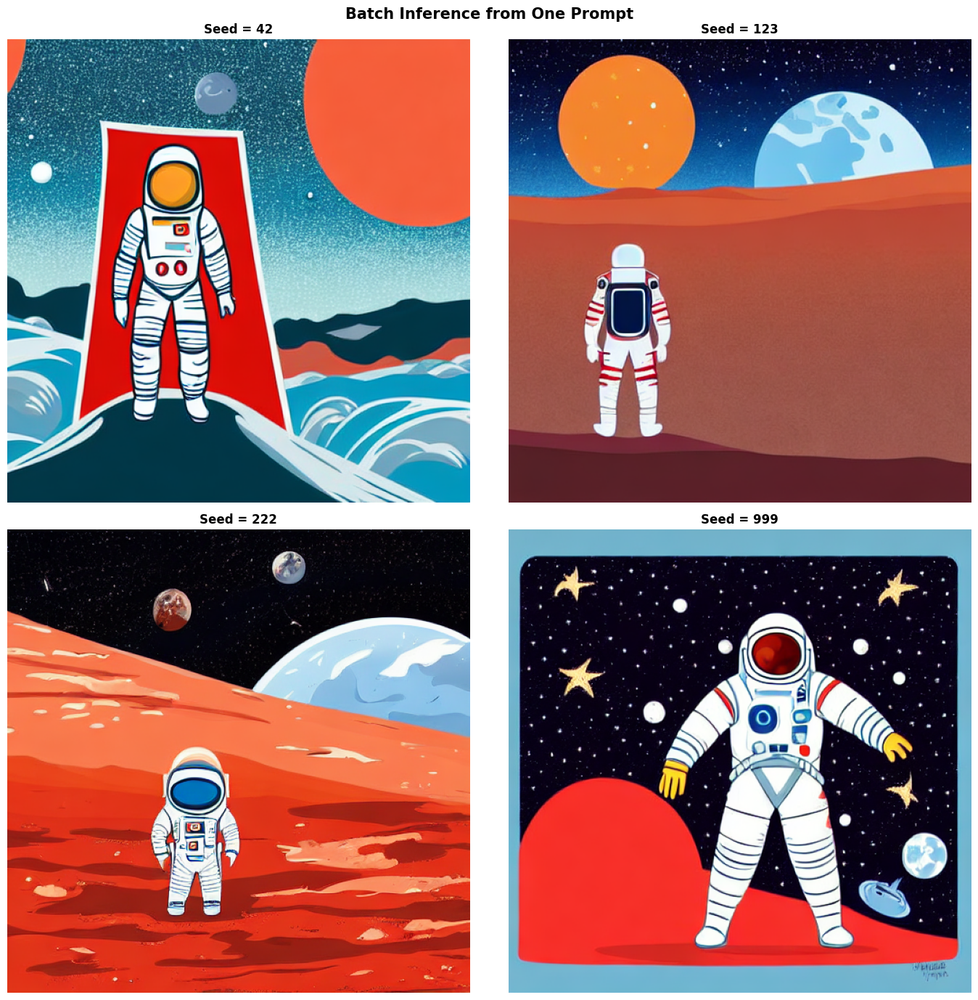

Saved: batch_inference.png


In [8]:
def generate_advanced_image(prompt, negative_prompt="", seed=42,
                             guidance_scale=7.5, num_inference_steps=50):
    generator = torch.Generator().manual_seed(seed)

    image = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

    return image

batch_seeds = [42, 123, 222, 999]
batch_images = []

print("Generating batch inference...")
for seed in batch_seeds:
    img = generate_advanced_image(
        prompt=prompt,
        negative_prompt=negative_prompt,
        seed=seed,
        guidance_scale=7.5,
        num_inference_steps=50
    )
    batch_images.append((seed, img))
    img.save(f"batch_seed_{seed}.png")
    print(f"Generated seed={seed}")

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()
for i, (seed, img) in enumerate(batch_images):
    axes[i].imshow(img)
    axes[i].set_title(f"Seed = {seed}", fontsize=12, fontweight='bold')
    axes[i].axis('off')
plt.suptitle("Batch Inference from One Prompt", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("batch_inference.png", dpi=150)
plt.show()
print("Saved: batch_inference.png")

## **Load Scheduler**

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


Generating with scheduler: DDIM...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: scheduler_DDIM.png
Generating with scheduler: PNDM...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: scheduler_PNDM.png
Generating with scheduler: Euler...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: scheduler_Euler.png
Generating with scheduler: DPMSolver...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: scheduler_DPMSolver.png


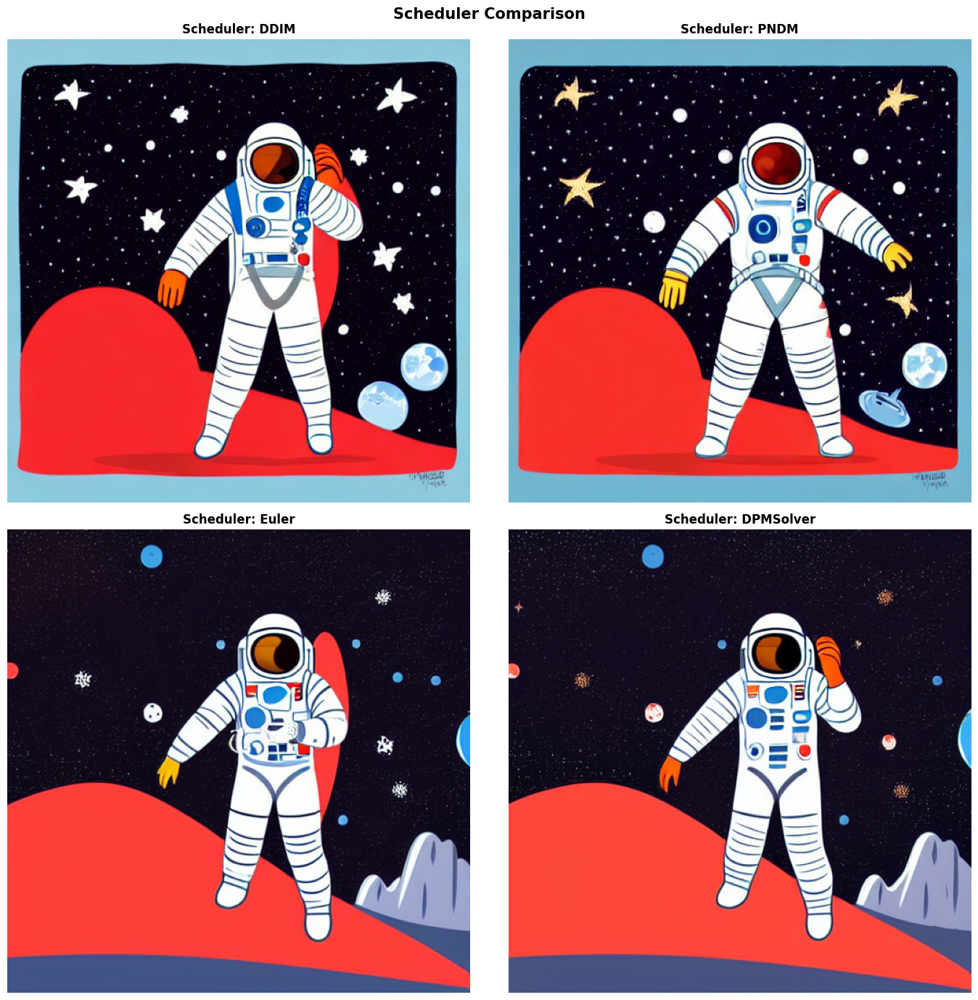

Saved: scheduler_comparison.png


In [9]:
schedulers = {
    "DDIM": DDIMScheduler.from_pretrained(model_id, subfolder="scheduler"),
    "PNDM": PNDMScheduler.from_pretrained(model_id, subfolder="scheduler"),
    "Euler": EulerDiscreteScheduler.from_pretrained(model_id, subfolder="scheduler"),
    "DPMSolver": DPMSolverMultistepScheduler.from_pretrained(model_id, subfolder="scheduler")
}

scheduler_images = []

for name, scheduler in schedulers.items():
    print(f"Generating with scheduler: {name}...")

    pipe.scheduler = scheduler

    generator = torch.Generator().manual_seed(seed)
    img = pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        generator=generator,
        guidance_scale=7.5,
        num_inference_steps=50
    ).images[0]

    scheduler_images.append((name, img))
    img.save(f"scheduler_{name}.png")
    print(f"Saved: scheduler_{name}.png")

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()
for i, (name, img) in enumerate(scheduler_images):
    axes[i].imshow(img)
    axes[i].set_title(f"Scheduler: {name}", fontsize=12, fontweight='bold')
    axes[i].axis('off')
plt.suptitle("Scheduler Comparison", fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig("scheduler_comparison.png", dpi=150)
plt.show()
print("Saved: scheduler_comparison.png")

### **Scheduler Comparation:**

*   **Gambar dengan "DDIM Scheduler":**  
1.  Menghasilkan gambar dengan kualitas cukup baik dan konsisten
2.  Proses sampling lebih cepat karena bisa skip beberapa langkah denoising
3.  Cocok digunakan ketika kecepatan generasi menjadi prioritas


*   **Gambar dengan "PNDM Scheduler":**  
1.  Menghasilkan gambar dengan detail yang lebih halus dibanding DDIM
2.  Menggunakan metode numerik yang lebih stabil sehingga hasil lebih smooth
3.  Merupakan scheduler default pada Stable Diffusion


*   **Gambar dengan "Euler Scheduler":**  
1.  Menghasilkan gambar dengan warna lebih vivid dan tajam
2.  Metode sederhana namun efektif, konvergen lebih cepat dengan sedikit steps
3.  Sangat baik digunakan pada inference steps yang rendah (20–30 steps)


*   **Gambar dengan "DPMSolver":**
1.   Menghasilkan gambar dengan kualitas terbaik dan detail paling tinggi
2.   Dirancang khusus untuk diffusion model sehingga sangat efisien
3.   Mampu menghasilkan gambar berkualitas tinggi hanya dengan 20 steps sekalipun






# **Kriteria 2: Menyempurnakan Gambar Melalui Image-to-Image**

## **Base + Refiner Image Generation**

Loading Base pipeline...


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Base pipeline loaded on: cuda
Loading Refiner pipeline...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', illustration']


Refiner pipeline loaded on: cuda
Stage 1: Generating base image...


  0%|          | 0/40 [00:00<?, ?it/s]

[transformers] Token indices sequence length is longer than the specified maximum sequence length for this model (79 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: [', illustration']


Stage 1 done. Saved: output_base_stage1_v2.png
Stage 2: Refining image...


  0%|          | 0/10 [00:00<?, ?it/s]

Stage 2 done. Saved: output_base_refiner_v2.png


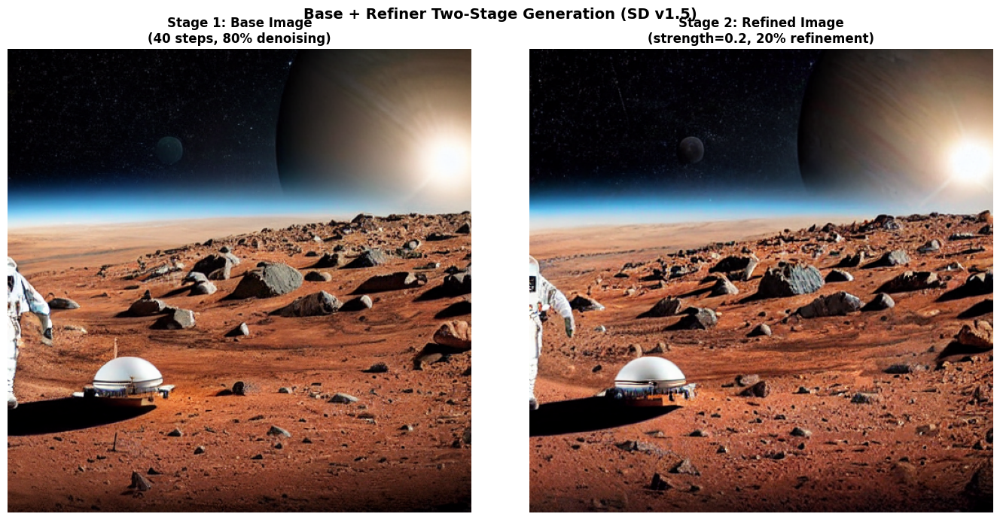

In [10]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model_id = "runwayml/stable-diffusion-v1-5"


print("Loading Base pipeline...")
base_pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
)
base_pipe = base_pipe.to(device)
print(f"Base pipeline loaded on: {device}")



print("Loading Refiner pipeline...")
refiner_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
)
refiner_pipe = refiner_pipe.to(device)
print(f"Refiner pipeline loaded on: {device}")



seed = 9
prompt = (
    "a full body astronaut in a white spacesuit standing in the center of frame, "
    "facing forward, on the surface of mars, red sandy terrain with rocks, "
    "black starry sky, planet earth visible in the background upper right corner, "
    "a broken damaged satellite with solar panels crashed on the right side, "
    "wide shot, full figure visible, centered composition, "
    "digital art, detailed, high quality, illustration"
)
negative_prompt = (
    "cropped, cut off, partial body, out of frame, close up, portrait, "
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)



print("Stage 1: Generating base image...")
generator = torch.Generator(device=device).manual_seed(seed)

base_steps = 50
stage1_steps = int(base_steps * 0.8)

base_image = base_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    generator=generator,
    num_inference_steps=stage1_steps,
    guidance_scale=9.0,
    height=512,
    width=512
).images[0]

base_image.save("output_base_stage1_v2.png")
print(f"Stage 1 done. Saved: output_base_stage1_v2.png")



print("Stage 2: Refining image...")
generator2 = torch.Generator(device=device).manual_seed(seed)

refined_image = refiner_pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=base_image,
    generator=generator2,
    num_inference_steps=base_steps,
    strength=0.2,
    guidance_scale=9.0
).images[0]

refined_image.save("output_base_refiner_v2.png")
print("Stage 2 done. Saved: output_base_refiner_v2.png")



fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(base_image)
axes[0].set_title(f"Stage 1: Base Image\n({stage1_steps} steps, 80% denoising)",
                  fontsize=12, fontweight='bold')
axes[0].axis('off')

axes[1].imshow(refined_image)
axes[1].set_title("Stage 2: Refined Image\n(strength=0.2, 20% refinement)",
                  fontsize=12, fontweight='bold')
axes[1].axis('off')

plt.suptitle("Base + Refiner Two-Stage Generation (SD v1.5)",
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("base_refiner_comparison_v2.png", dpi=150)
plt.show()

## **Inpainting**

### **Load Model Inpainting**

In [11]:
inpaint_model_id = "runwayml/stable-diffusion-inpainting"

inpaint_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    inpaint_model_id,
    torch_dtype=torch.float16,
    use_safetensors=False
)
inpaint_pipe = inpaint_pipe.to(device)

def inpaint_engine(image, mask, prompt, seed=9,
                   negative_prompt="", guidance_scale=7.5,
                   num_inference_steps=50):


    image = image.resize((512, 512))
    mask = mask.resize((512, 512))

    generator = torch.Generator(device=device).manual_seed(seed)

    result = inpaint_pipe(
        prompt=prompt,
        negative_prompt=negative_prompt,
        image=image,
        mask_image=mask,
        generator=generator,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

    return result



input_image = Image.open("output_advanced.png").convert("RGB")
input_image = input_image.resize((512, 512))

model_index.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

### **Manual Masking**

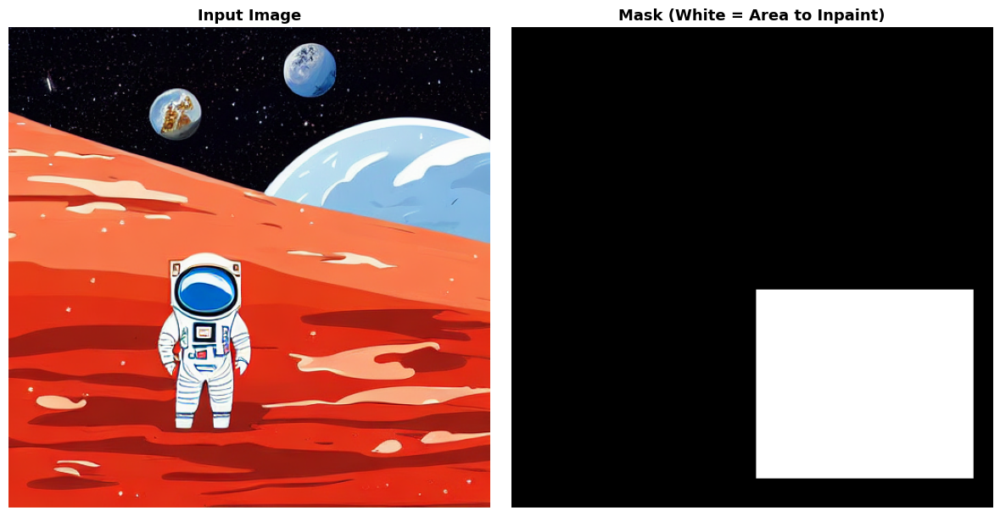

In [12]:
def create_manual_mask(image_size=(512, 512)):
    mask = Image.new("RGB", image_size, "black")
    draw = ImageDraw.Draw(mask)

    draw.rectangle([260, 280, 490, 480], fill="white")

    return mask

mask_image = create_manual_mask()

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(input_image)
axes[0].set_title("Input Image", fontsize=13, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(mask_image)
axes[1].set_title("Mask (White = Area to Inpaint)", fontsize=13, fontweight='bold')
axes[1].axis('off')
plt.tight_layout()
plt.savefig("inpaint_input_and_mask.png", dpi=150)
plt.show()

### **Generate**

Running inpainting...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: output_inpainting.png


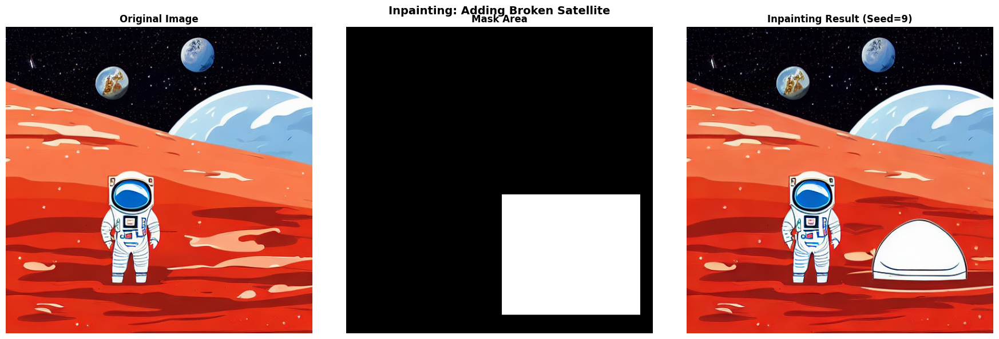

Saved: inpainting_comparison.png


In [13]:
seed = 9
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)
inpaint_prompt = (
    "a broken damaged satellite with solar panels crashed on the surface of mars, "
    "metallic debris, golden solar panels, detailed, high quality, "
    "consistent with mars background"
)

print("Running inpainting...")
inpainted_image = inpaint_engine(
    image=input_image,
    mask=mask_image,
    prompt=inpaint_prompt,
    seed=seed,
    negative_prompt=negative_prompt,
    guidance_scale=7.5,
    num_inference_steps=50
)

inpainted_image.save("output_inpainting.png")
print("Saved: output_inpainting.png")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(input_image)
axes[0].set_title("Original Image", fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(mask_image)
axes[1].set_title("Mask Area", fontsize=12, fontweight='bold')
axes[1].axis('off')
axes[2].imshow(inpainted_image)
axes[2].set_title("Inpainting Result (Seed=9)", fontsize=12, fontweight='bold')
axes[2].axis('off')
plt.suptitle("Inpainting: Adding Broken Satellite", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("inpainting_comparison.png", dpi=150)
plt.show()
print("Saved: inpainting_comparison.png")

## **Inpainting Menggunakan Automasking**

### **load Model Segmentation Untuk Masking**

In [14]:
print("Loading segmentation model...")
segmentor = hf_pipeline(
    "image-segmentation",
    model="facebook/maskformer-swin-base-coco",
    device=0 if torch.cuda.is_available() else -1
)
print("Segmentation model loaded!")

Loading segmentation model...


config.json:   0%|          | 0.00/10.8k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/411M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/648 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/380 [00:00<?, ?B/s]

Segmentation model loaded!


### **Masking with Segmentation Model**

[transformers] `label_ids_to_fuse` unset. No instance will be fused.


Detected labels:
  - sky-other-merged (score: 0.92)
  - car (score: 0.99)
Label 'person' not found. Using background instead.


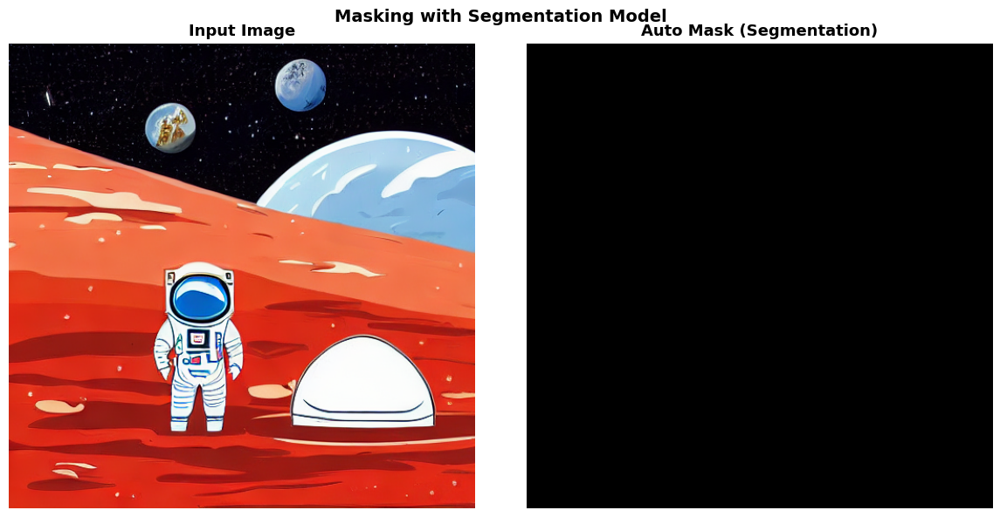

Saved: automask_result.png


In [15]:
def create_automask(image, target_label="person", expand_pixels=10):

    results = segmentor(image)

    print("Detected labels:")
    for r in results:
        print(f"  - {r['label']} (score: {r['score']:.2f})")

    mask = Image.new("RGB", image.size, "black")
    mask_array = np.zeros((image.size[1], image.size[0]), dtype=np.uint8)

    found = False
    for r in results:
        if target_label.lower() in r['label'].lower():
            seg_mask = np.array(r['mask'])
            mask_array = np.logical_or(mask_array, seg_mask).astype(np.uint8) * 255
            found = True
            print(f"Mask created for: {r['label']}")

    if not found:
        print(f"Label '{target_label}' not found. Using background instead.")
        for r in results:
            if any(kw in r['label'].lower() for kw in ['ground', 'dirt', 'sand', 'terrain', 'rock']):
                seg_mask = np.array(r['mask'])
                mask_array = np.logical_or(mask_array, seg_mask).astype(np.uint8) * 255

    mask_pil = Image.fromarray(mask_array).convert("RGB")
    return mask_pil


input_image = Image.open("output_inpainting.png").convert("RGB").resize((512, 512))

auto_mask = create_automask(input_image, target_label="person")

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(input_image)
axes[0].set_title("Input Image", fontsize=13, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(auto_mask)
axes[1].set_title("Auto Mask (Segmentation)", fontsize=13, fontweight='bold')
axes[1].axis('off')
plt.suptitle("Masking with Segmentation Model", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("automask_result.png", dpi=150)
plt.show()
print("Saved: automask_result.png")

### **Generate**

Running inpainting with automask...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: output_auto_inpainting.png


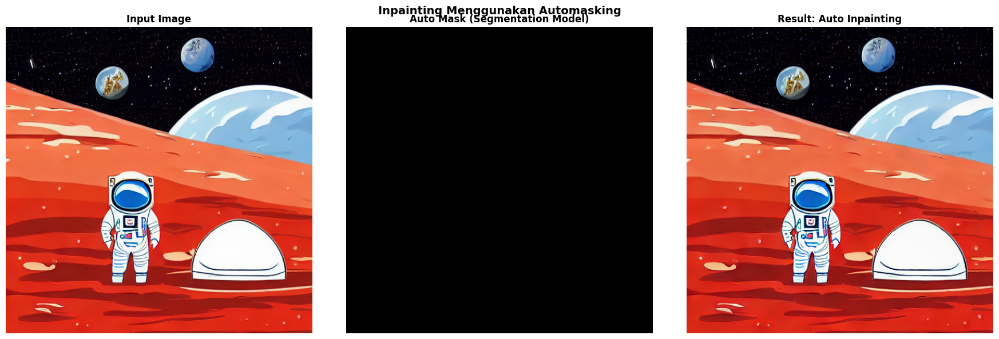

Saved: auto_inpainting_comparison.png


In [16]:
seed = 9
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)
inpaint_prompt = (
    "a broken damaged satellite with solar panels crashed on the surface of mars, "
    "metallic debris, golden solar panels bent and destroyed, "
    "red sandy terrain, detailed, high quality, digital art"
)

print("Running inpainting with automask...")
auto_inpainted = inpaint_engine(
    image=input_image,
    mask=auto_mask,
    prompt=inpaint_prompt,
    seed=seed,
    negative_prompt=negative_prompt,
    guidance_scale=7.5,
    num_inference_steps=50
)

auto_inpainted.save("output_auto_inpainting.png")
print("Saved: output_auto_inpainting.png")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(input_image)
axes[0].set_title("Input Image", fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(auto_mask)
axes[1].set_title("Auto Mask (Segmentation Model)", fontsize=12, fontweight='bold')
axes[1].axis('off')
axes[2].imshow(auto_inpainted)
axes[2].set_title("Result: Auto Inpainting", fontsize=12, fontweight='bold')
axes[2].axis('off')
plt.suptitle("Inpainting Menggunakan Automasking", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("auto_inpainting_comparison.png", dpi=150)
plt.show()
print("Saved: auto_inpainting_comparison.png")

## **Outpainting**

### **Prepare the Canvas**

Original size : (512, 512)
Expanded size : (768, 512)
Direction     : right


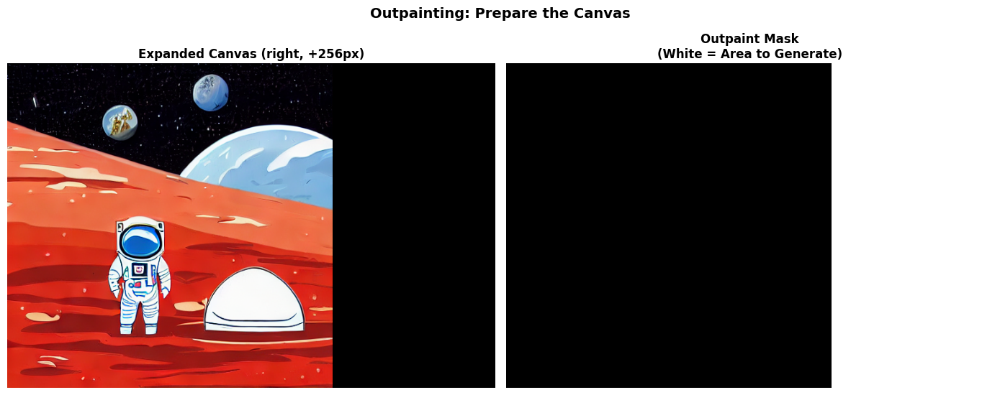

Saved: outpaint_canvas.png


In [17]:
def prepare_outpainting(image, direction="right", expand_pixels=256):

    original_w, original_h = image.size

    if direction == "right":
        new_w, new_h = original_w + expand_pixels, original_h
        paste_pos = (0, 0)
        mask_box = (original_w, 0, new_w, new_h)
    elif direction == "left":
        new_w, new_h = original_w + expand_pixels, original_h
        paste_pos = (expand_pixels, 0)
        mask_box = (0, 0, expand_pixels, new_h)
    elif direction == "down":
        new_w, new_h = original_w, original_h + expand_pixels
        paste_pos = (0, 0)
        mask_box = (0, original_h, new_w, new_h)
    elif direction == "up":
        new_w, new_h = original_w, original_h + expand_pixels
        paste_pos = (0, expand_pixels)
        mask_box = (0, 0, new_w, expand_pixels)
    else:
        raise ValueError("direction harus salah satu dari: 'left', 'right', 'up', 'down'")

    expanded_image = Image.new("RGB", (new_w, new_h), (0, 0, 0))
    expanded_image.paste(image, paste_pos)

    mask_image = Image.new("RGB", (new_w, new_h), "black")
    draw = ImageDraw.Draw(mask_image)
    draw.rectangle(mask_box, fill="white")

    return expanded_image, mask_image


base_for_outpainting = Image.open("output_auto_inpainting.png").convert("RGB").resize((512, 512))

DIRECTION = "right"
EXPAND_PIXELS = 256

expanded_canvas, outpaint_mask = prepare_outpainting(
    image=base_for_outpainting,
    direction=DIRECTION,
    expand_pixels=EXPAND_PIXELS
)

print(f"Original size : {base_for_outpainting.size}")
print(f"Expanded size : {expanded_canvas.size}")
print(f"Direction     : {DIRECTION}")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(expanded_canvas)
axes[0].set_title(f"Expanded Canvas ({DIRECTION}, +{EXPAND_PIXELS}px)",
                  fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(outpaint_mask)
axes[1].set_title("Outpaint Mask\n(White = Area to Generate)",
                  fontsize=12, fontweight='bold')
axes[1].axis('off')
plt.suptitle("Outpainting: Prepare the Canvas", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("outpaint_canvas.png", dpi=150)
plt.show()
print("Saved: outpaint_canvas.png")

### **Generate**

Running outpainting...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: output_outpainting.png


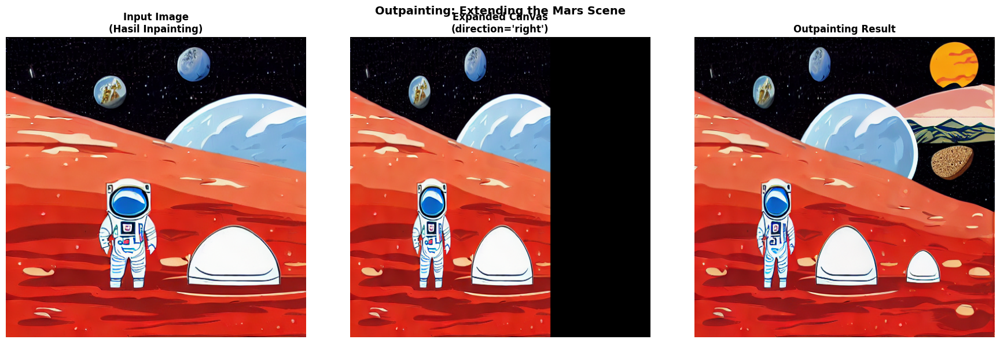

Saved: outpainting_comparison.png


In [18]:
seed = 9
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)
outpaint_prompt = (
    "continuation of mars surface landscape, red sandy terrain with rocks, "
    "black starry sky, distant mars mountains, consistent lighting, "
    "seamless extension, digital art, detailed, high quality"
)

expanded_resized = expanded_canvas.resize((512, 512))
mask_resized = outpaint_mask.resize((512, 512))

print("Running outpainting...")
outpainted_image = inpaint_engine(
    image=expanded_resized,
    mask=mask_resized,
    prompt=outpaint_prompt,
    seed=seed,
    negative_prompt=negative_prompt,
    guidance_scale=8.0,
    num_inference_steps=50
)

outpainted_image.save("output_outpainting.png")
print("Saved: output_outpainting.png")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(base_for_outpainting)
axes[0].set_title("Input Image\n(Hasil Inpainting)", fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(expanded_resized)
axes[1].set_title(f"Expanded Canvas\n(direction='{DIRECTION}')", fontsize=12, fontweight='bold')
axes[1].axis('off')
axes[2].imshow(outpainted_image)
axes[2].set_title("Outpainting Result", fontsize=12, fontweight='bold')
axes[2].axis('off')
plt.suptitle("Outpainting: Extending the Mars Scene", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("outpainting_comparison.png", dpi=150)
plt.show()
print("Saved: outpainting_comparison.png")

## **Outpainting Zoom Out**

### **Prepare Canvas for Zoom Out**

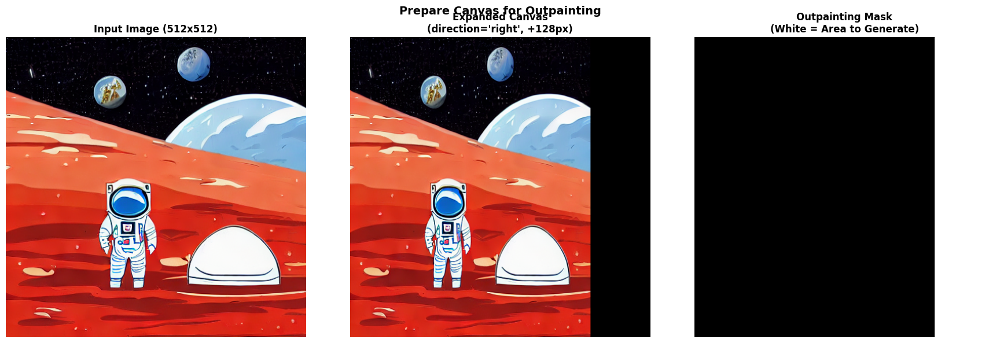

Saved: outpainting_canvas.png


In [21]:
def prepare_outpainting(image, direction="right", expand_px=128):

    w, h = image.size

    if direction == "right":
        new_w, new_h = w + expand_px, h
        paste_pos = (0, 0)
        mask_box  = (w, 0, new_w, new_h)
    elif direction == "left":
        new_w, new_h = w + expand_px, h
        paste_pos = (expand_px, 0)
        mask_box  = (0, 0, expand_px, new_h)
    elif direction == "down":
        new_w, new_h = w, h + expand_px
        paste_pos = (0, 0)
        mask_box  = (0, h, new_w, new_h)
    elif direction == "up":
        new_w, new_h = w, h + expand_px
        paste_pos = (0, expand_px)
        mask_box  = (0, 0, new_w, expand_px)
    else:
        raise ValueError("direction harus: 'left', 'right', 'up', atau 'down'")

    new_canvas = Image.new("RGB", (new_w, new_h), (0, 0, 0))
    new_canvas.paste(image, paste_pos)

    mask = Image.new("RGB", (new_w, new_h), "black")
    draw = ImageDraw.Draw(mask)
    draw.rectangle(mask_box, fill="white")

    return new_canvas, mask


outpaint_input = Image.open("output_auto_inpainting.png").convert("RGB").resize((512, 512))

DIRECTION  = "right"
EXPAND_PX  = 128

canvas, outpaint_mask = prepare_outpainting(
    outpaint_input,
    direction=DIRECTION,
    expand_px=EXPAND_PX
)

canvas_resized      = canvas.resize((512, 512))
outpaint_mask_resized = outpaint_mask.resize((512, 512))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(outpaint_input)
axes[0].set_title("Input Image (512x512)", fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(canvas_resized)
axes[1].set_title(f"Expanded Canvas\n(direction='{DIRECTION}', +{EXPAND_PX}px)",
                  fontsize=12, fontweight='bold')
axes[1].axis('off')
axes[2].imshow(outpaint_mask_resized)
axes[2].set_title("Outpainting Mask\n(White = Area to Generate)",
                  fontsize=12, fontweight='bold')
axes[2].axis('off')
plt.suptitle("Prepare Canvas for Outpainting", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("outpainting_canvas.png", dpi=150)
plt.show()
print("Saved: outpainting_canvas.png")

### **Generate**

Running outpainting to the right...


  0%|          | 0/50 [00:00<?, ?it/s]

Saved: output_outpainting.png


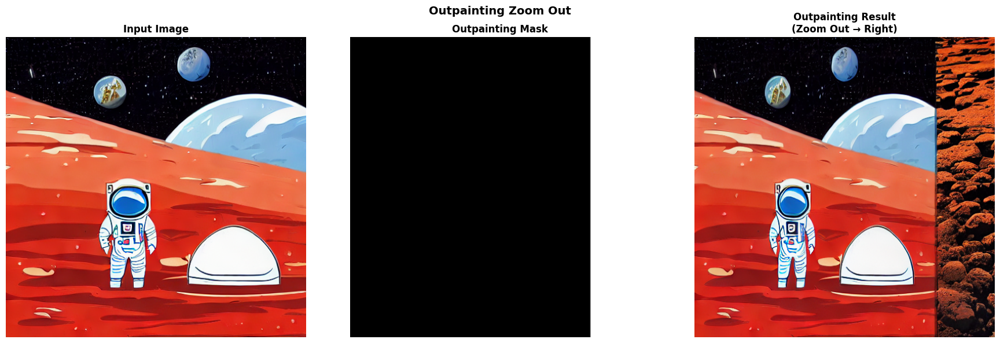

Saved: outpainting_comparison.png


In [22]:
seed = 9
negative_prompt = (
    "photorealistic, realistic, photograph, 3d render, messy, blurry, "
    "low quality, bad art, ugly, sketch, grainy, unfinished, chromatic aberration"
)
outpaint_prompt = (
    "continuation of mars surface landscape, red sandy terrain with rocks, "
    "black starry sky, wide establishing shot, "
    "seamless extension, consistent lighting, digital art, high quality"
)

print(f"Running outpainting to the {DIRECTION}...")
outpainted_image = inpaint_engine(
    image=canvas_resized,
    mask=outpaint_mask_resized,
    prompt=outpaint_prompt,
    seed=seed,
    negative_prompt=negative_prompt,
    guidance_scale=7.5,
    num_inference_steps=50
)

outpainted_image.save("output_outpainting.png")
print("Saved: output_outpainting.png")

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(outpaint_input)
axes[0].set_title("Input Image", fontsize=12, fontweight='bold')
axes[0].axis('off')
axes[1].imshow(outpaint_mask_resized)
axes[1].set_title("Outpainting Mask", fontsize=12, fontweight='bold')
axes[1].axis('off')
axes[2].imshow(outpainted_image)
axes[2].set_title(f"Outpainting Result\n(Zoom Out → {DIRECTION.capitalize()})",
                  fontsize=12, fontweight='bold')
axes[2].axis('off')
plt.suptitle("Outpainting Zoom Out", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig("outpainting_comparison.png", dpi=150)
plt.show()
print("Saved: outpainting_comparison.png")

In [23]:
torch.cuda.empty_cache()